# Prepare environment

In [ ]:
!pip install numpy==1.19.5
!pip install gdown
!git clone https://github.com/cedricoeldorf/ConditionalStyleGAN
%tensorflow_version 1.x

from IPython.display import clear_output
clear_output()

In [ ]:
!gdown https://drive.google.com/uc?id=1jVQZN9OiX8jl59zWz8CHFnQP9HtfYrDv
!gdown https://drive.google.com/uc?id=1ptG88Thr9Oae0cTBlPO3jRhFz-cIbmjb
!gdown https://drive.google.com/uc?id=1jRbrCuOtTboDWMBSWCB82gj8Socxdr8h

Downloading...
From: https://drive.google.com/uc?id=1jVQZN9OiX8jl59zWz8CHFnQP9HtfYrDv
To: /content/cond.pkl
100% 28.2M/28.2M [00:00<00:00, 40.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ptG88Thr9Oae0cTBlPO3jRhFz-cIbmjb
To: /content/manga.pkl
100% 28.2M/28.2M [00:00<00:00, 89.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1jRbrCuOtTboDWMBSWCB82gj8Socxdr8h
To: /content/holo.pkl
100% 28.2M/28.2M [00:01<00:00, 24.4MB/s]


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Jul 10 22:35:36 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
%cd ConditionalStyleGAN

/content/ConditionalStyleGAN


In [ ]:
NUM_LABELS = 37

In [ ]:
import os
import pickle
import numpy as np
import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
import config

tflib.init_tf()

# Visualization methods

In [ ]:
import math
import matplotlib.pyplot as plt
from matplotlib.pyplot import subplots
def plot_grid(imgs):
    sqr = math.floor(math.sqrt(len(imgs)))
    fig, subs = subplots(max(2, math.ceil(len(imgs) / sqr)), max(2, sqr), figsize=(15, 15))
    for i in range(len(imgs)):
        subs[i // sqr, i % sqr].imshow(imgs[i])
        subs[i // sqr, i % sqr].axis('off')
    fig.show()

In [ ]:
def plot_row(imgs):
    n = len(imgs)
    fig, subs = plt.subplots(1, n, figsize=(5 * n, 5))
    for i in range(len(imgs)):
        subs[i].imshow(imgs[i])
        subs[i].axis('off')
    fig.show()

In [ ]:
def gen_image(latents, labels, truncation_psi=0.6):
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    image = Gs.run(latents, labels, truncation_psi=truncation_psi, randomize_noise=True, output_transform=fmt)
    cur_img = PIL.Image.fromarray(image[0], 'RGB')
    return cur_img

In [ ]:
def gen_random(class_to_gen, truncation_psi=0.6):
    imgs = []
    rnd = np.random.RandomState(None)
    labels = np.zeros((1, NUM_LABELS))
    labels[0, class_to_gen] = 1

    for i in range(16):
        latents = rnd.randn(1, Gs.input_shape[1])
        imgs.append(gen_image(latents, labels, truncation_psi=truncation_psi))
    return imgs

In [ ]:
def gen_half_random(latents0, class_to_gen, truncation_psi=0.6):
    imgs = []
    rnd = np.random.RandomState(None)
    labels = np.zeros((1, NUM_LABELS))
    labels[0, class_to_gen] = 1

    for i in range(16):
        latents1 = rnd.randn(1, Gs.input_shape[1] - latents0.shape[1])
        latents = np.concatenate((latents0, latents1), axis=1)
        imgs.append(gen_image(latents, labels, truncation_psi=truncation_psi))
    return imgs

In [ ]:
def gen_interpolation(latents0, latents1, class_to_gen, num_steps=7, truncation_psi=0.6):
    imgs = []
    latents_delta = (latents_b - latents_a) / (num_steps - 1)
    labels = np.zeros((1, NUM_LABELS))
    labels[0, class_to_gen] = 1

    for i in range(num_steps):
        latents = latents0 + latents_delta * i
        imgs.append(gen_image(latents, labels, truncation_psi=truncation_psi))
    return imgs

In [ ]:
def gen_truncation_trick(latents, class_to_gen, truncation_values=[1, 0.8, 0.6, 0.04, 0.6, 0.8, 1]):
    imgs = []
    labels = np.zeros((1, NUM_LABELS))
    labels[0, class_to_gen] = 1
    for psi in truncation_values:
        imgs.append(gen_image(latents, labels, truncation_psi=psi))
    return imgs

# Plot different models

In [39]:
#@title Load model
model = 'manga' #@param ['conditional', 'manga', 'holo']

network_snapshot = ''
if model == 'conditional':
    network_snapshot = '../cond.pkl'
    CLASS_LABEL = 5
elif model == 'manga':
    network_snapshot = '../manga.pkl'
    CLASS_LABEL = 1
elif model == 'holo':
    network_snapshot = '../holo.pkl'
    CLASS_LABEL = 15
_G, _D, Gs = pickle.load(open(network_snapshot, "rb"))
LATENTS_SIZE = Gs.input_shape[1]

In [40]:
random_cond = gen_random(CLASS_LABEL)

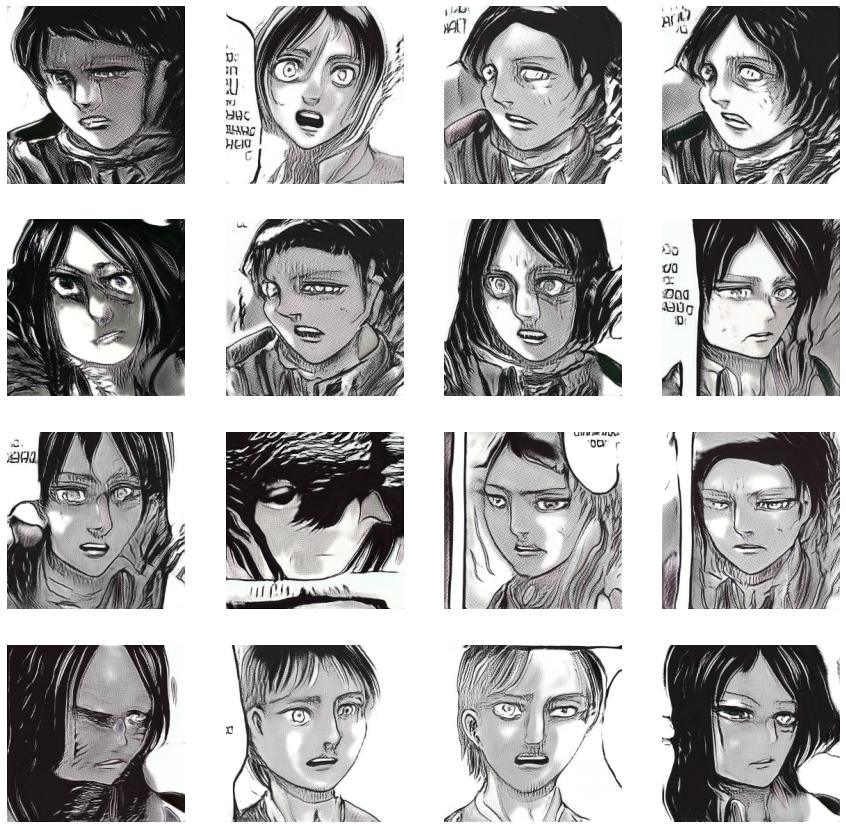

In [41]:
plot_grid(random_cond)

In [43]:
rnd = np.random.RandomState(None)
latents0 = rnd.randn(1, LATENTS_SIZE // 2)
half_random_cond = gen_half_random(latents0, CLASS_LABEL)

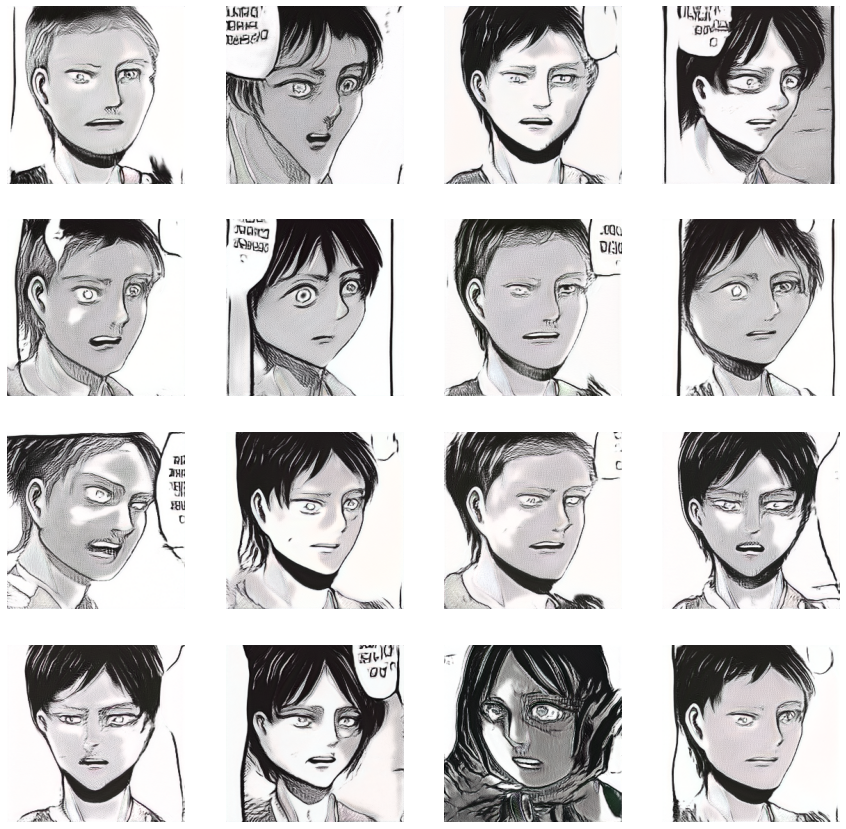

In [44]:
plot_grid(half_random_cond)

In [45]:
rnd = np.random.RandomState(None)
latents_a = rnd.randn(1, LATENTS_SIZE) 
latents_b = rnd.randn(1, LATENTS_SIZE)
interpolation_cond = gen_interpolation(latents_a, latents_b, CLASS_LABEL)

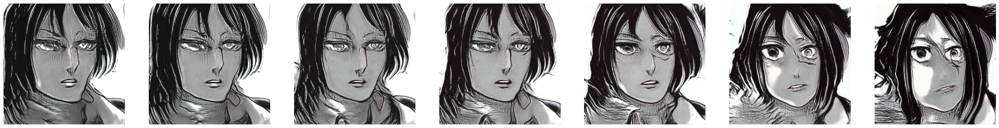

In [46]:
plot_row(interpolation_cond)

In [47]:
rnd = np.random.RandomState(None)
latents = rnd.randn(1, 128) 
truncation_cond = gen_truncation_trick(latents, CLASS_LABEL)

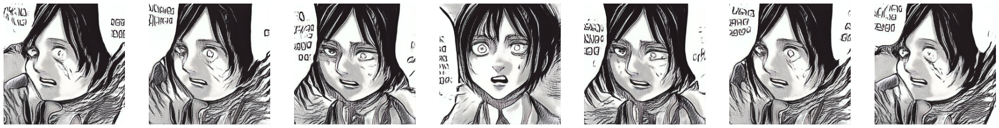

In [48]:
plot_row(truncation_cond)

# Plot all conditions

In [49]:
_G, _D, Gs = pickle.load(open('../cond.pkl', "rb"))
LATENTS_SIZE = Gs.input_shape[1]

In [56]:
def gen_conds(latents, trunc_psi=0.6):
    cur_imgs = []
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    for i in range(36):
        labels = np.zeros((1, 37))
        labels[0, i + 1] = 1
        
        images = Gs.run(latents, labels, truncation_psi=trunc_psi, randomize_noise=True, output_transform=fmt)
        cur_img = PIL.Image.fromarray(images[0], 'RGB')
        cur_imgs.append(cur_img)
    return cur_imgs

In [58]:
imgs1 = []
rnd = np.random.RandomState(None)
latents_0 = rnd.randn(1, LATENTS_SIZE)
latents_1 = rnd.randn(1, LATENTS_SIZE)
latents_2 = rnd.randn(1, LATENTS_SIZE)
latents_3 = rnd.randn(1, LATENTS_SIZE)

imgs1.extend(gen_conds(latents_0))
imgs1.extend(gen_conds(latents_1))
imgs1.extend(gen_conds(latents_2))
imgs1.extend(gen_conds(latents_3))

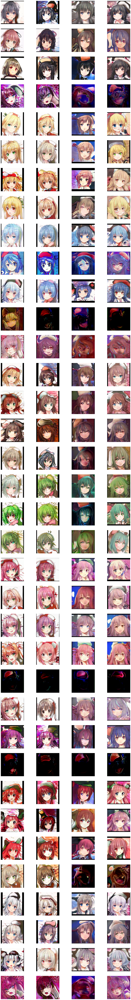

In [61]:
fig1, subs = plt.subplots(36, 4, figsize=(20, 150))

for i in range(len(imgs1)):
    subs[i % 36, i // 36].imshow(imgs1[i])
    subs[i % 36, i // 36].axis('off')
fig1.show()